In [1]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten
from tensorflow.keras.callbacks import TensorBoard
import cv2
import os
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np
import time

In [2]:
# Define the log directory for TensorBoard
log_dir = "logs/"

# Initialize TensorBoard callback
tensorboard_callback = TensorBoard(log_dir=log_dir)

In [ ]:
!unzip Dataset.zip

In [4]:
# generators
train_ds = keras.utils.image_dataset_from_directory(
    directory = 'Dataset/train',
    labels='inferred',
    label_mode = 'int',
    batch_size=32,
    image_size=(256,256)
)

validation_ds = keras.utils.image_dataset_from_directory(
    directory = 'Dataset/validation',
    labels='inferred',
    label_mode = 'int',
    batch_size=32,
    image_size=(256,256)
)

# Load test dataset
test_ds = keras.utils.image_dataset_from_directory(
    directory='Dataset/test',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256)
)


Found 120 files belonging to 2 classes.
Found 40 files belonging to 2 classes.
Found 40 files belonging to 2 classes.


In [5]:
# Normalize
def process(image,label):
    image = tf.cast(image/255. ,tf.float32)
    return image,label

train_ds = train_ds.map(process)
validation_ds = validation_ds.map(process)
test_ds = test_ds.map(process)

In [6]:
# create CNN model

model = Sequential()

model.add(Conv2D(32,kernel_size=(3,3),padding='valid',activation='relu',input_shape=(256,256,3)))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))

model.add(Conv2D(64,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))

model.add(Conv2D(128,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))

model.add(Flatten())

model.add(Dense(128,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(1,activation='sigmoid'))

In [7]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 30, 30, 128)       0

In [8]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [9]:
#Define number of iterations
no_of_epochs = 20

# Initialize lists to store training accuracy and training time
training_accuracies = []
training_losses = []

test_accuracies = []
test_losses = []

iteration_count = 0

# Manual loop for iterations
for Epoch in range(no_of_epochs):
    print(f"Epoch {Epoch + 1}/{no_of_epochs}:")

    # Initialize variables to accumulate batch accuracy and size
    total_correct = 0
    total_samples = 0

    # Iterate over each batch in the training dataset
    for images, labels in train_ds:
        print(f"iteration = {iteration_count+1}")
        # Train on current batch
        train_loss, train_accuracy = model.train_on_batch(images, labels)

        # Calculate training accuracy for the current iteration
        training_accuracies.append(train_accuracy)
        training_losses.append(train_loss)


        # Prediction in test data for each iteration
        test_loss, test_accuracy = model.evaluate(test_ds, steps = len(test_ds))

        print(f"Training accuracy = {train_accuracy:.4f}")
        print(f"Training loss = {train_loss:.4f}")


        # Append test accuracy and test loss for each iteration
        test_accuracies.append(test_accuracy)
        test_losses.append(test_loss)

        # Print test accuracy and test loss for each iteration
        print(f"Test accuracy = {test_accuracy:.4f}")
        print(f"Test loss= {test_loss:.4f}")
        print()
        # Write to TensorBoard
        with tf.summary.create_file_writer(log_dir).as_default():
            tf.summary.scalar("Training Accuracy", train_accuracy, step=iteration_count)
            tf.summary.scalar("Training Loss", train_loss, step=iteration_count)
            tf.summary.scalar("Test Accuracy", test_accuracy, step=iteration_count)
        iteration_count+=1



Epoch 1/20:
iteration = 1
2/2 [==============================] - 1s 270ms/step - loss: 3.5179 - accuracy: 0.5000
Training accuracy = 0.4375
Training loss = 0.7006
Test accuracy = 0.5000
Test loss= 3.5179

iteration = 2
2/2 [==============================] - 0s 14ms/step - loss: 0.8883 - accuracy: 0.5000
Training accuracy = 0.3750
Training loss = 4.7146
Test accuracy = 0.5000
Test loss= 0.8883

iteration = 3
2/2 [==============================] - 0s 13ms/step - loss: 0.7137 - accuracy: 0.5000
Training accuracy = 0.5312
Training loss = 0.8183
Test accuracy = 0.5000
Test loss= 0.7137

iteration = 4
2/2 [==============================] - 0s 14ms/step - loss: 0.7035 - accuracy: 0.5000
Training accuracy = 0.3750
Training loss = 0.7598
Test accuracy = 0.5000
Test loss= 0.7035

Epoch 2/20:
iteration = 5
2/2 [==============================] - 0s 16ms/step - loss: 0.7111 - accuracy: 0.5000
Training accuracy = 0.5000
Training loss = 0.6979
Test accuracy = 0.5000
Test loss= 0.7111

iteration = 6
2

In [10]:
# Start TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 21ms/step


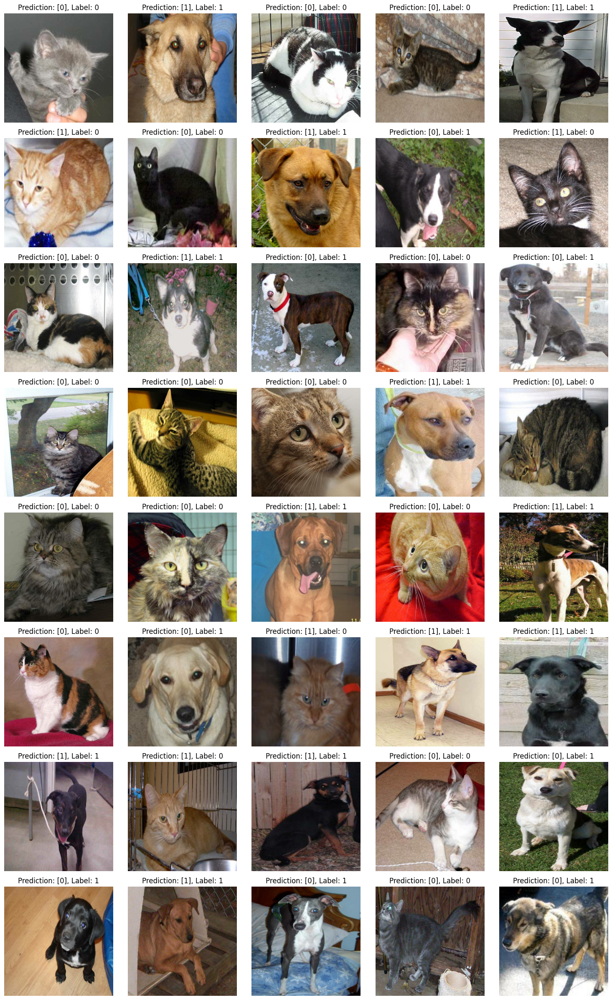

In [64]:
def img_plot(model, dataset):
    predictions = []
    labels = []
    image_list = []
    count = 0
    fig, axs = plt.subplots(40 // 5 , 5, figsize=(15, 3 * (40 // 5 )))

    for images, labels_batch in dataset:
        predictions_batch = model.predict(images)
        predictions.extend(np.round(predictions_batch).astype(int))
        labels.extend(labels_batch.numpy())
        image_list.extend(images.numpy())
        for i, image in enumerate(images):
            axs[count // 5, count % 5].imshow(image)
            axs[count // 5, count % 5].axis('off')
            axs[count // 5, count % 5].set_title(f"Prediction: {np.round(predictions_batch[i]).astype(int)}, Label: {labels_batch[i]}")
            count += 1
            if count >= 40:
                break
        if count >= 40:
            break

    plt.tight_layout()
    plt.show()
    return np.array(predictions).flatten(), np.array(labels)

# Call the function with your model and test dataset
predictions, labels = img_plot(model, test_ds)